In [ ]:
# libraries required
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn import model_selection
from sklearn import metrics
from sklearn import linear_model
from sklearn import ensemble
from sklearn import tree
from sklearn import svm
import xgboost

In [ ]:
data = pd.read_csv("/content/sample_data/weatherAUS.csv")
data

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,0.0,No
142189,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,0.0,No
142190,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,0.0,No
142191,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,0.0,No


In [ ]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


In [ ]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM
count,141556.000000,141871.000000,140787.000000,81350.000000,74377.000000,132923.000000,140845.000000,139563.000000,140419.000000,138583.000000,128179.000000,128212.000000,88536.000000,85099.000000,141289.000000,139467.000000,142193.000000
mean,12.186400,23.226784,2.349974,5.469824,7.624853,39.984292,14.001988,18.637576,68.843810,51.482606,1017.653758,1015.258204,4.437189,4.503167,16.987509,21.687235,2.360682
std,6.403283,7.117618,8.465173,4.188537,3.781525,13.588801,8.893337,8.803345,19.051293,20.797772,7.105476,7.036677,2.887016,2.720633,6.492838,6.937594,8.477969
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,0.000000
25%,7.600000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000,0.000000
50%,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,0.000000
75%,16.800000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000,0.800000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,371.000000


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null

In [ ]:
data.isnull().sum()

Date                 0
Location             0
MinTemp            637
MaxTemp            322
Rainfall          1406
Evaporation      60843
Sunshine         67816
WindGustDir       9330
WindGustSpeed     9270
WindDir9am       10013
WindDir3pm        3778
WindSpeed9am      1348
WindSpeed3pm      2630
Humidity9am       1774
Humidity3pm       3610
Pressure9am      14014
Pressure3pm      13981
Cloud9am         53657
Cloud3pm         57094
Temp9am            904
Temp3pm           2726
RainToday         1406
RISK_MM              0
RainTomorrow         0
dtype: int64

<Axes: >

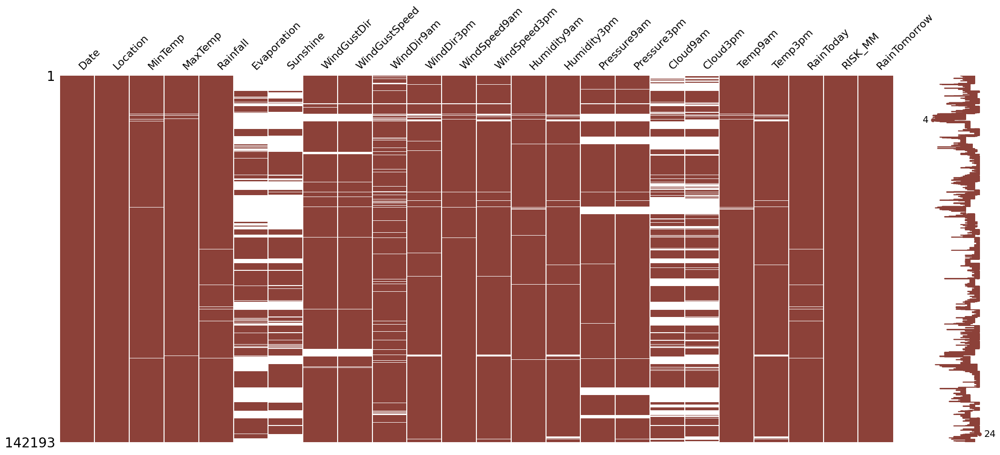

In [ ]:
import missingno as msno
msno.matrix(data,color=(0.55, 0.255, 0.225), fontsize=16)

In [ ]:
data_cat = data[['RainToday', 'WindGustDir', 'WindDir9am', 'WindDir3pm']]
data.drop(columns=['Evaporation', 'Sunshine', 'Cloud9am', 'Cloud3pm'],axis=1,inplace=True)
data.drop(columns=['RainToday', 'WindGustDir', 'WindDir9am', 'WindDir3pm'],axis=1,inplace=True)

In [ ]:
data['MinTemp'].fillna(data['MinTemp'].mean(),inplace=True)
data['MaxTemp'].fillna(data['MaxTemp'].mean(),inplace=True)
data['Rainfall'].fillna(data['Rainfall'].mean(),inplace=True)
data['WindGustSpeed'].fillna(data['WindGustSpeed'].mean(),inplace=True)
data['WindSpeed9am'].fillna(data['WindSpeed9am'].mean(),inplace=True)
data['WindSpeed3pm'].fillna(data['WindSpeed3pm'].mean(),inplace=True)
data['Humidity9am'].fillna(data['Humidity9am'].mean(),inplace=True)
data['Humidity3pm'].fillna(data['Humidity3pm'].mean(),inplace=True)
data['Pressure9am'].fillna(data['Pressure9am'].mean(),inplace=True)
data['Pressure3pm'].fillna(data['Pressure3pm'].mean(),inplace=True)
data['Temp9am'].fillna(data['Temp9am'].mean(),inplace=True)
data['Temp3pm'].fillna(data['Temp3pm'].mean(),inplace=True)

In [ ]:
cat_names = data_cat.columns

In [ ]:
# initializing the simple imputer for missing categorical values
import numpy as np
from sklearn.impute import SimpleImputer
imp_mode = SimpleImputer(missing_values=np.nan, strategy='most_frequent')

In [ ]:
data_cat = imp_mode.fit_transform(data_cat)

In [ ]:
data_cat = pd.DataFrame(data_cat,columns=cat_names)

In [ ]:
data = pd.concat([data,data_cat],axis=1)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Assuming 'df' is your DataFrame

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Iterate through each column in the DataFrame
for column in data.columns:
    # Check if the column has object dtype (non-numeric)
    if data[column].dtype == 'object':
        # Use label encoder to transform only non-numeric columns
        data[column] = label_encoder.fit_transform(data[column])

# Now, 'df' contains label-encoded values for all non-numeric columns

In [ ]:
data.corr()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RISK_MM,RainTomorrow,RainToday,WindGustDir,WindDir9am,WindDir3pm
Date,1.000000,0.021490,0.016930,0.040321,-0.012453,-0.025140,-0.015892,-0.025815,0.000940,-0.010464,0.033430,0.027625,0.027114,0.027682,-0.012408,-0.010947,-0.011235,-0.016999,0.001430,0.003347
Location,0.021490,1.000000,-0.006194,-0.020490,-0.003457,0.069269,0.077038,0.064180,-0.002065,0.011066,0.036492,0.046345,-0.015596,-0.022718,-0.002788,-0.003579,-0.004911,-0.005055,-0.004434,0.008325
MinTemp,0.016930,-0.006194,1.000000,0.733919,0.103314,0.173331,0.174946,0.174187,-0.232372,0.005913,-0.424357,-0.434034,0.897999,0.699828,0.123928,0.083717,0.055645,-0.136321,-0.029635,-0.158958
MaxTemp,0.040321,-0.020490,0.733919,1.000000,-0.074202,0.066329,0.014586,0.050381,-0.499777,-0.499725,-0.309093,-0.397422,0.880087,0.969735,-0.044154,-0.159087,-0.226474,-0.212208,-0.212589,-0.181344
Rainfall,-0.012453,-0.003457,0.103314,-0.074202,1.000000,0.127250,0.085977,0.056762,0.221392,0.249609,-0.159676,-0.120366,0.011384,-0.077553,0.301844,0.236874,0.500286,0.044853,0.085142,0.047904
WindGustSpeed,-0.025140,0.069269,0.173331,0.066329,0.127250,1.000000,0.577864,0.658377,-0.209272,-0.025822,-0.426600,-0.384642,0.146756,0.032274,0.156620,0.225264,0.148244,0.137648,0.074660,0.136660
WindSpeed9am,-0.015892,0.077038,0.174946,0.014586,0.085977,0.577864,1.000000,0.513079,-0.269027,-0.030991,-0.215178,-0.165050,0.128769,0.005026,0.068828,0.090524,0.100568,0.009727,0.109955,0.050191
WindSpeed3pm,-0.025815,0.064180,0.174187,0.050381,0.056762,0.658377,0.513079,1.000000,-0.144270,0.015789,-0.277495,-0.239743,0.162144,0.028443,0.048554,0.086909,0.078357,0.083963,0.111090,0.089810
Humidity9am,0.000940,-0.002065,-0.232372,-0.499777,0.221392,-0.209272,-0.269027,-0.144270,1.000000,0.659852,0.131601,0.176168,-0.471137,-0.492430,0.170541,0.255158,0.348841,0.067950,0.088850,0.026074
Humidity3pm,-0.010464,0.011066,0.005913,-0.499725,0.249609,-0.025822,-0.030991,0.015789,0.659852,1.000000,-0.025769,0.048566,-0.217593,-0.555777,0.306711,0.439678,0.370556,0.063939,0.148903,-0.007186


In [ ]:
cor = data.corr()

<Axes: >

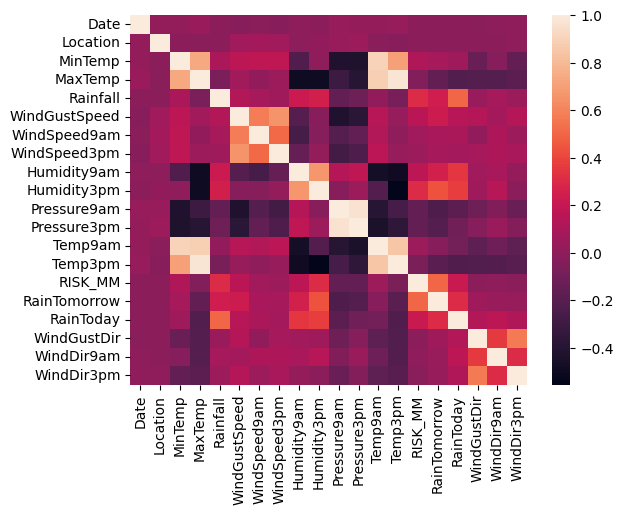

In [ ]:
sns.heatmap(data=cor,xticklabels=cor.columns.values,yticklabels=cor.columns.values)

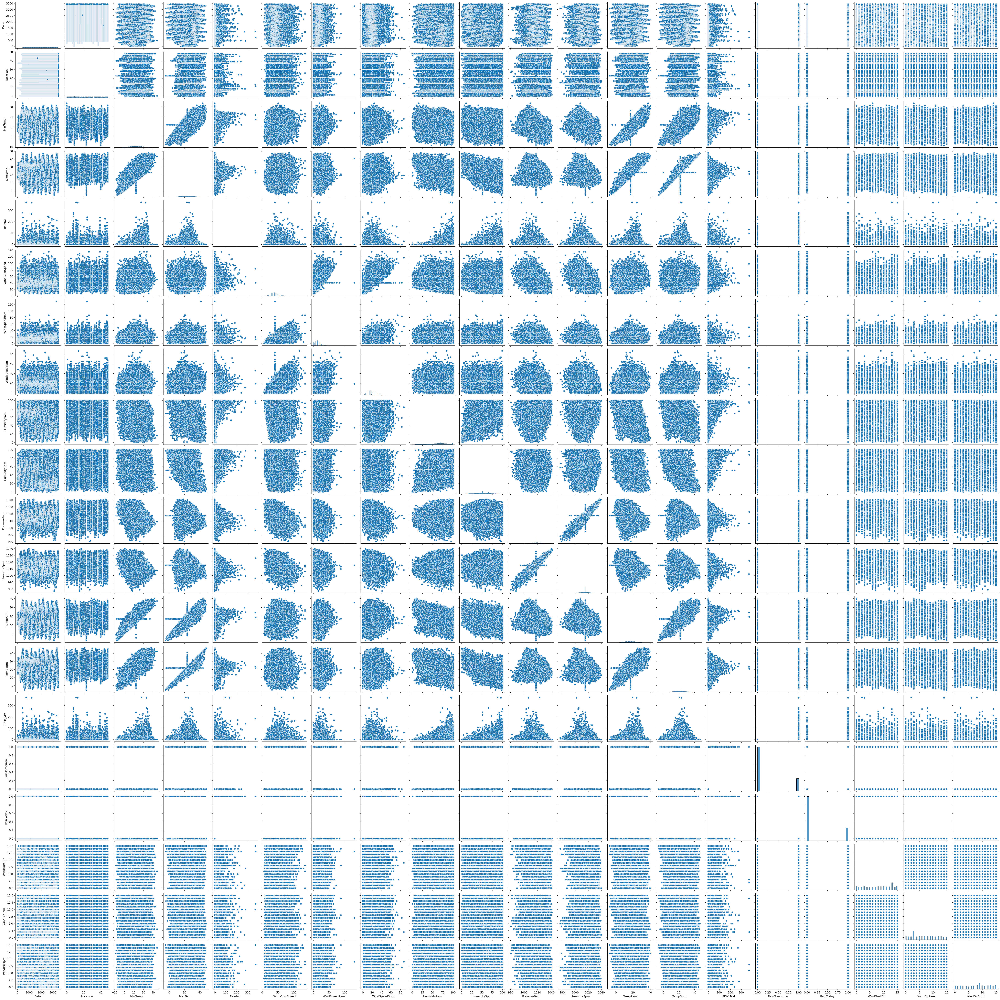

In [ ]:
sns.pairplot(data)

<Axes: >

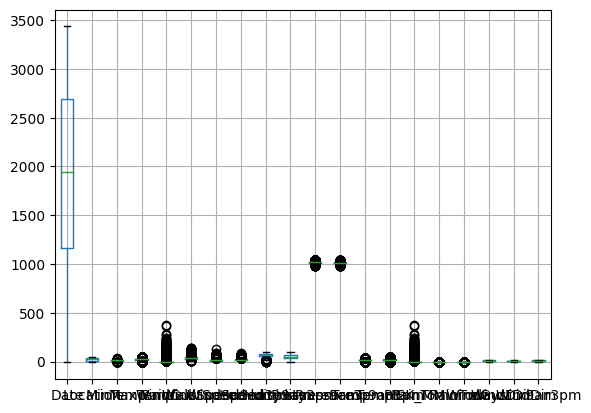

In [ ]:
data.boxplot()

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
#splitting x and y values
y = data['RainTomorrow']
x = data.drop('RainTomorrow',axis=1)

In [ ]:
x = data.drop('Date',axis=1)

In [ ]:
names = x.columns

In [ ]:
names

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'RISK_MM',
       'RainTomorrow', 'RainToday', 'WindGustDir', 'WindDir9am', 'WindDir3pm'],
      dtype='object')

In [ ]:
sc = StandardScaler()

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Assuming 'x' is your DataFrame
numeric_columns = data.select_dtypes(include=['number']).columns
x_numeric = data[numeric_columns]

sc = StandardScaler()
x = sc.fit_transform(x_numeric)

In [ ]:
x = sc.fit_transform(x)

In [ ]:
# Assuming 'x' is your DataFrame and 'names' is a list of column names
x = pd.DataFrame(data, columns=names)


In [ ]:
from sklearn import model_selection

In [ ]:
x_train,x_test,y_train,y_test=model_selection.train_test_split(x,y,test_size=0.2,random_state =0)

In [ ]:
x_train.shape,y_train.shape,x_test.shape,y_test.shape

((113754, 19), (113754,), (28439, 19), (28439,))

In [ ]:
import xgboost
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression

XGBoost = xgboost.XGBRFClassifier()
Rand_forest = RandomForestClassifier()
svm = SVC()
Dtree = DecisionTreeClassifier()
GBM = GradientBoostingClassifier()
log = LogisticRegression()


In [ ]:
# Check unique values in 'RainTomorrow'
print(data['RainTomorrow'].unique())


[0 1]


In [ ]:
Rand_forest.fit(x_train, y_train)


RandomForestClassifier()

In [ ]:
svm.fit(x_train, y_train)


SVC()

In [ ]:
Dtree.fit(x_train, y_train)


DecisionTreeClassifier()

In [ ]:
GBM.fit(x_train, y_train)


GradientBoostingClassifier()

In [ ]:
log.fit(x_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
log.fit(x_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
# Fit the models with the encoded target variable
XGBoost.fit(x_train, y_train)


XGBRFClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bytree=None, device=None,
                early_stopping_rounds=None, enable_categorical=False,
                eval_metric=None, feature_types=None, gamma=None,
                grow_policy=None, importance_type=None,
                interaction_constraints=None, max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=None, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                multi_strategy=None, n_estimators=None, n_jobs=None,
                num_parallel_tree=None, objective='binary:logistic',
                random_state=None, reg_alpha=None, ...)

In [ ]:
p1 = XGBoost.predict(x_train)
p2 = Rand_forest.predict(x_train)
p3 = svm.predict(x_train)
p4 = Dtree.predict(x_train)
p5 = GBM.predict(x_train)
p6 = log.predict(x_train)

In [ ]:
print("xgboost:",metrics.accuracy_score(y_train,p1))
print("Rand_forest:",metrics.accuracy_score(y_train,p2))
print("svm:",metrics.accuracy_score(y_train,p3))
print("Dtree:",metrics.accuracy_score(y_train,p4))
print("GBM:",metrics.accuracy_score(y_train,p5))
print("log:",metrics.accuracy_score(y_train,p6))

xgboost: 1.0
Rand_forest: 1.0
svm: 0.8700001758179932
Dtree: 1.0
GBM: 1.0
log: 0.9997011094115372


In [ ]:
t1 = XGBoost.predict(x_test)
t2 = Rand_forest.predict(x_test)
t3 = svm.predict(x_test)
t4 = Dtree.predict(x_test)
t5 = GBM.predict(x_test)
t6 = log.predict(x_test)

In [ ]:
print("xgboost:",metrics.accuracy_score(y_test,t1))
print("Rand_forest:",metrics.accuracy_score(y_test,t2))
print("svm:",metrics.accuracy_score(y_test,t3))
print("Dtree:",metrics.accuracy_score(y_test,t4))
print("GBM:",metrics.accuracy_score(y_test,t5))
print("log:",metrics.accuracy_score(y_test,t6))

xgboost: 1.0
Rand_forest: 1.0
svm: 0.8719364253314111
Dtree: 1.0
GBM: 1.0
log: 0.9997538591371005


In [ ]:
conf_matrix1 = metrics.confusion_matrix(y_test,t1)

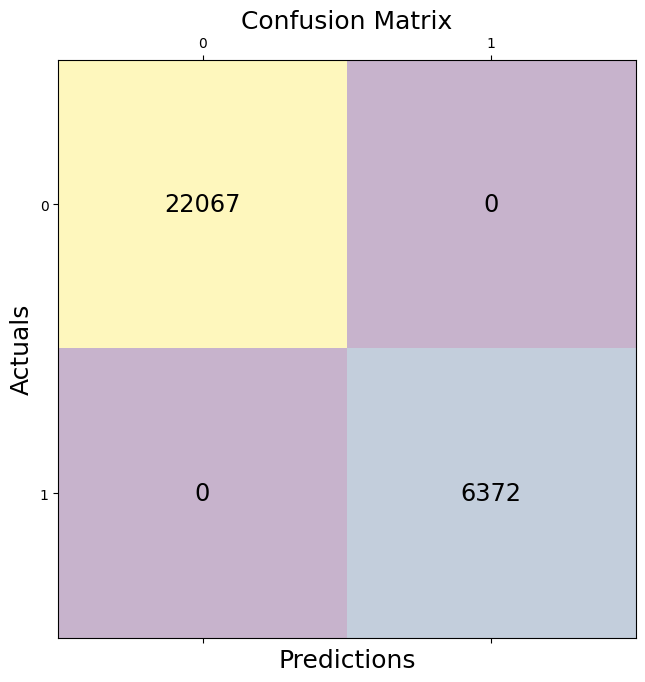

In [ ]:
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix1, alpha=0.3)
for i in range(conf_matrix1.shape[0]):
    for j in range(conf_matrix1.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix1[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()



In [ ]:
conf_matrix2 = metrics.confusion_matrix(y_test,t2)

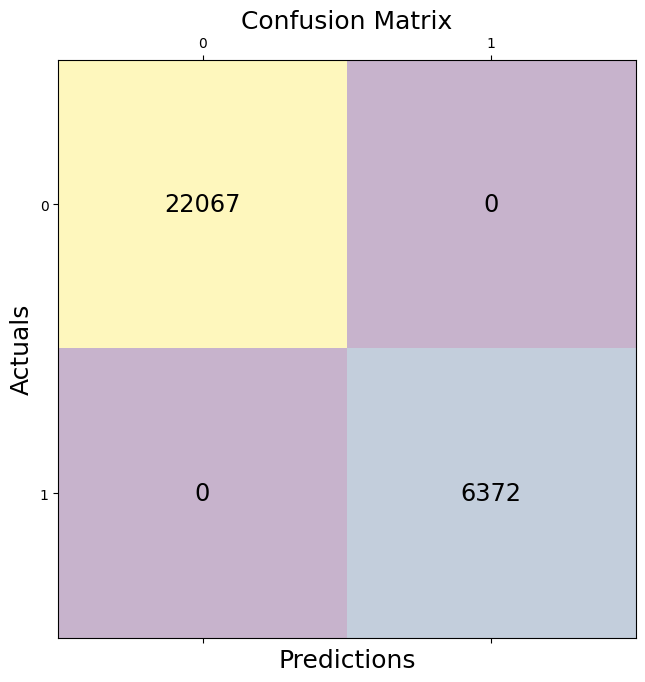

In [ ]:
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix2, alpha=0.3)
for i in range(conf_matrix2.shape[0]):
    for j in range(conf_matrix2.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix2[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()



In [ ]:
conf_matrix3 = metrics.confusion_matrix(y_test,t3)

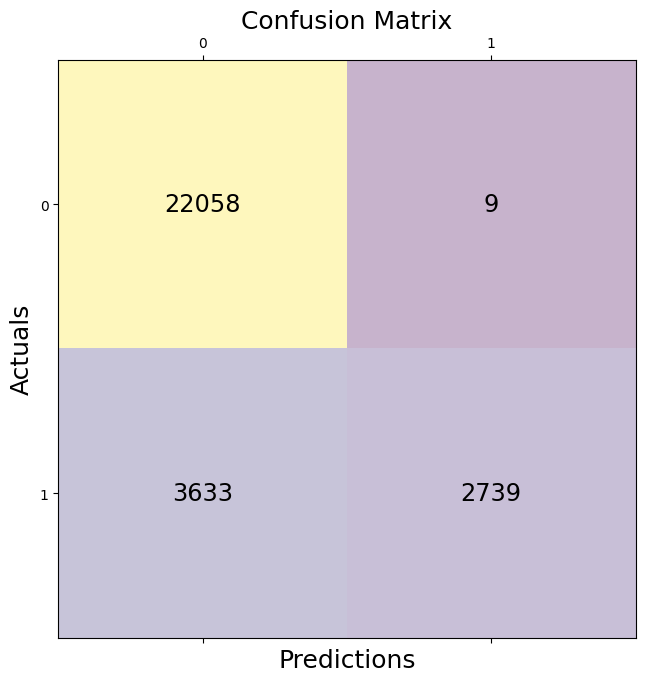

In [ ]:
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix3, alpha=0.3)
for i in range(conf_matrix3.shape[0]):
    for j in range(conf_matrix3.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix3[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()



In [ ]:
conf_matrix4 = metrics.confusion_matrix(y_test,t4)

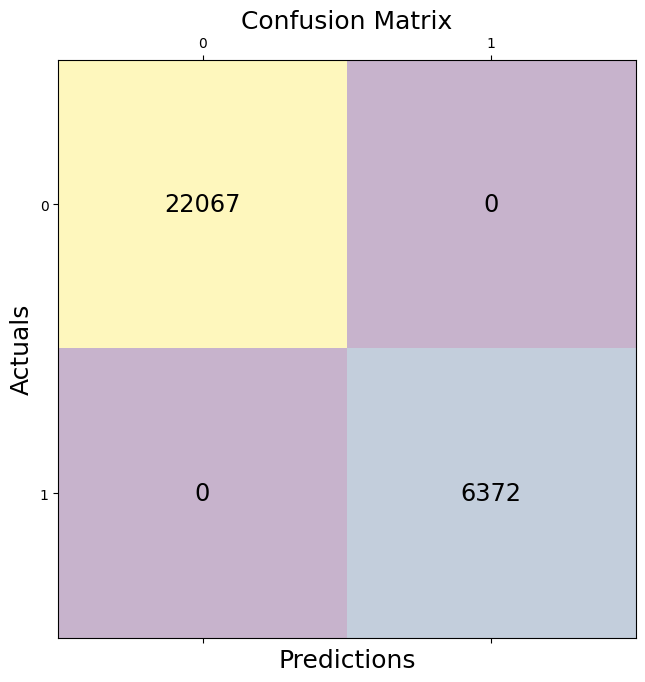

In [ ]:
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix4, alpha=0.3)
for i in range(conf_matrix4.shape[0]):
    for j in range(conf_matrix4.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix4[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()



In [ ]:
conf_matrix5 = metrics.confusion_matrix(y_test,t5)

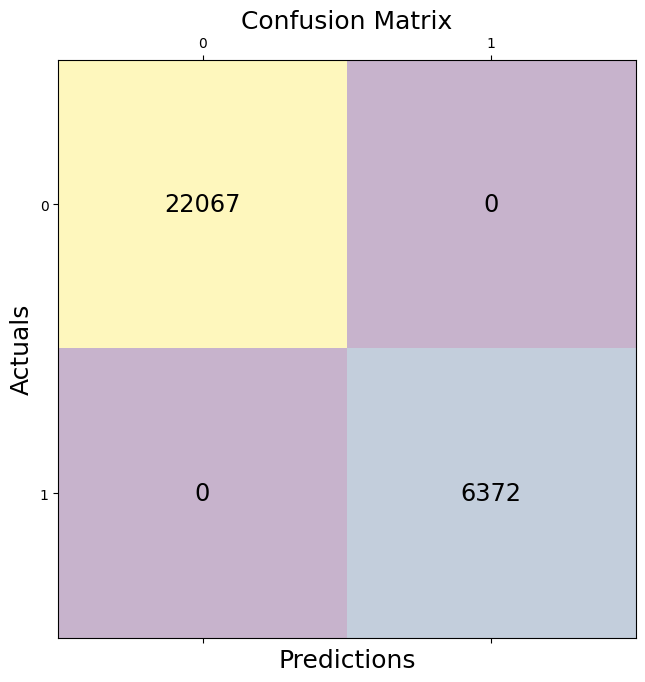

In [ ]:
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix5, alpha=0.3)
for i in range(conf_matrix5.shape[0]):
    for j in range(conf_matrix5.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix5[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

In [ ]:
conf_matrix6 = metrics.confusion_matrix(y_test,t6)


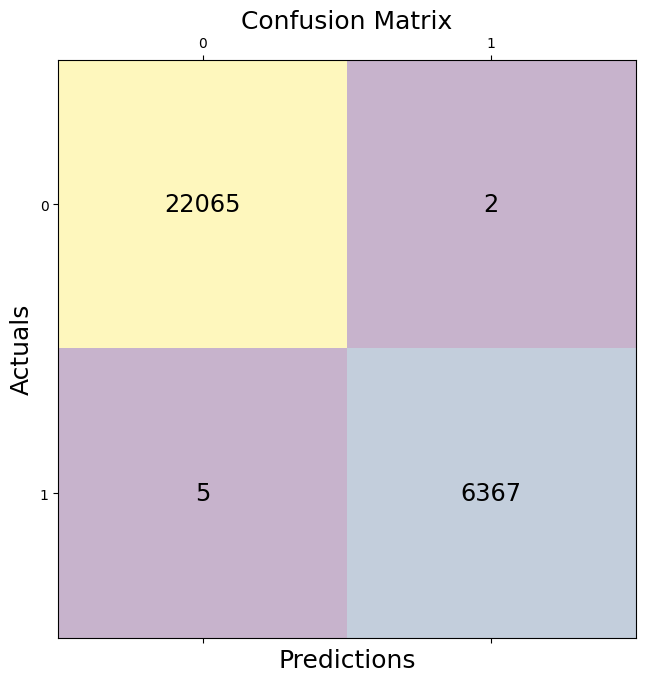

In [ ]:
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix6, alpha=0.3)
for i in range(conf_matrix6.shape[0]):
    for j in range(conf_matrix6.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix6[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Assuming conf_matrix is already calculated
tn, fp, fn, tp = conf_matrix1.ravel()

# Calculate metrics
accuracy = accuracy_score(y_test, t1)
precision = precision_score(y_test, t1)
recall = recall_score(y_test, t1)

# Print confusion matrix
print("Confusion Matrix:")
print(conf_matrix1)

# Print metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)


Confusion Matrix:
[[22067     0]
 [    0  6372]]
Accuracy: 1.0
Precision: 1.0
Recall: 1.0


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Assuming conf_matrix is already calculated
tn, fp, fn, tp = conf_matrix2.ravel()

# Calculate metrics
accuracy = accuracy_score(y_test, t1)
precision = precision_score(y_test, t1)
recall = recall_score(y_test, t1)

# Print confusion matrix
print("Confusion Matrix:")
print(conf_matrix2)

# Print metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)


Confusion Matrix:
[[22067     0]
 [    0  6372]]
Accuracy: 1.0
Precision: 1.0
Recall: 1.0


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Assuming conf_matrix is already calculated
tn, fp, fn, tp = conf_matrix3.ravel()

# Calculate metrics
accuracy = accuracy_score(y_test, t1)
precision = precision_score(y_test, t1)
recall = recall_score(y_test, t1)

# Print confusion matrix
print("Confusion Matrix:")
print(conf_matrix3)

# Print metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)


Confusion Matrix:
[[22058     9]
 [ 3633  2739]]
Accuracy: 1.0
Precision: 1.0
Recall: 1.0


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Assuming conf_matrix is already calculated
tn, fp, fn, tp = conf_matrix4.ravel()

# Calculate metrics
accuracy = accuracy_score(y_test, t1)
precision = precision_score(y_test, t1)
recall = recall_score(y_test, t1)

# Print confusion matrix
print("Confusion Matrix:")
print(conf_matrix4)

# Print metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)


Confusion Matrix:
[[22067     0]
 [    0  6372]]
Accuracy: 1.0
Precision: 1.0
Recall: 1.0


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Assuming conf_matrix is already calculated
tn, fp, fn, tp = conf_matrix5.ravel()

# Calculate metrics
accuracy = accuracy_score(y_test, t1)
precision = precision_score(y_test, t1)
recall = recall_score(y_test, t1)

# Print confusion matrix
print("Confusion Matrix:")
print(conf_matrix5)

# Print metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)


Confusion Matrix:
[[22067     0]
 [    0  6372]]
Accuracy: 1.0
Precision: 1.0
Recall: 1.0


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Assuming conf_matrix is already calculated
tn, fp, fn, tp = conf_matrix6.ravel()

# Calculate metrics
accuracy = accuracy_score(y_test, t1)
precision = precision_score(y_test, t1)
recall = recall_score(y_test, t1)

# Print confusion matrix
print("Confusion Matrix:")
print(conf_matrix6)

# Print metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)


Confusion Matrix:
[[22065     2]
 [    5  6367]]
Accuracy: 1.0
Precision: 1.0
Recall: 1.0


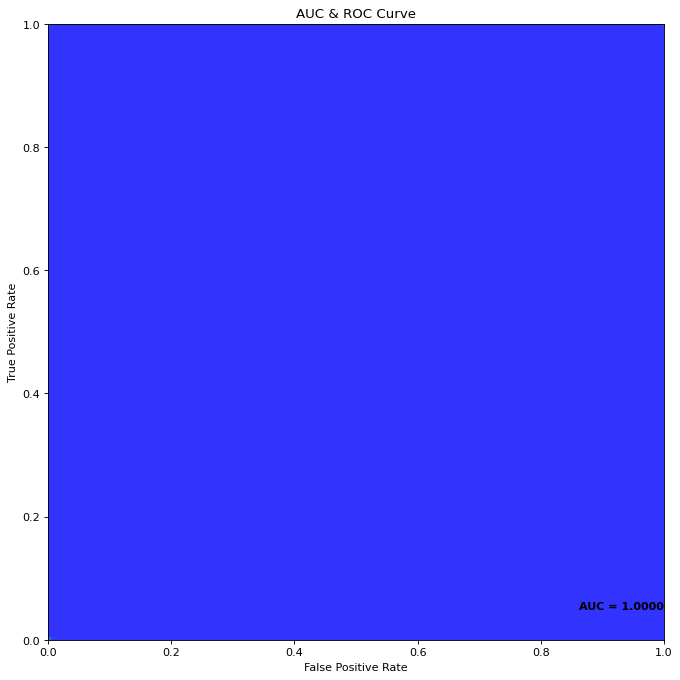

In [ ]:
auc = metrics.roc_auc_score(y_test, t1)

fpr, tpr, thresholds = metrics.roc_curve(y_test, t1)

plt.figure(figsize=(12, 10), dpi=80)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(fpr, tpr, 'v')
plt.fill_between(fpr, tpr, facecolor='blue', alpha=0.8)
plt.text(1, 0.05, f'AUC = {auc:.4f}', ha='right', fontsize=10, weight='bold', color='black')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()


# **Saving the model**

In [ ]:
import pickle

In [ ]:
pickle.dump(XGBoost,open('rainfall.pkl','wb'))
pickle.dump(label_encoder,open('encoder.pkl','wb'))
pickle.dump(imp_mode,open('impter.pkl','wb'))
pickle.dump(sc,open('scale.pkl','wb'))